<a href="https://colab.research.google.com/github/hatkiet/Project_4/blob/Mia-branch/Heart_Attack__ML_4_MH.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import required libraries and dependencies
import warnings
warnings.simplefilter(action='ignore')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import confusion_matrix,accuracy_score,roc_curve,classification_report

In [2]:
# Load the data into a Pandas DataFrame
df = pd.read_csv("heart_2022_with_nans.csv")
# Display sample data
df.head()

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,RemovedTeeth,HadHeartAttack,...,HeightInMeters,WeightInKilograms,BMI,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
0,Alabama,Female,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,NaN,No,...,NaN,NaN,NaN,No,No,Yes,No,"Yes, received tetanus shot but not sure what type",No,No
1,Alabama,Female,Excellent,0.0,0.0,NaN,No,6.0,NaN,No,...,1.60,68.04,26.57,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No
2,Alabama,Female,Very good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,5.0,NaN,No,...,1.57,63.50,25.61,No,No,No,No,NaN,No,Yes
3,Alabama,Female,Excellent,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,7.0,NaN,No,...,1.65,63.50,23.30,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No
4,Alabama,Female,Fair,2.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,NaN,No,...,1.57,53.98,21.77,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No


In [3]:
# Find the duplicated values
df.duplicated().sum()

# Drop duplicated values
df.drop_duplicates(inplace=True)

# Check again information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 444975 entries, 0 to 445131
Data columns (total 40 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   State                      444975 non-null  object 
 1   Sex                        444975 non-null  object 
 2   GeneralHealth              443782 non-null  object 
 3   PhysicalHealthDays         434053 non-null  float64
 4   MentalHealthDays           435913 non-null  float64
 5   LastCheckupTime            436674 non-null  object 
 6   PhysicalActivities         443887 non-null  object 
 7   SleepHours                 439527 non-null  float64
 8   RemovedTeeth               433620 non-null  object 
 9   HadHeartAttack             441915 non-null  object 
 10  HadAngina                  440575 non-null  object 
 11  HadStroke                  443423 non-null  object 
 12  HadAsthma                  443207 non-null  object 
 13  HadSkinCancer              441837 

In [4]:
# Finding NAN values
nan_values = df.isna().sum().sort_values(ascending=False)
nan_values_percentage = (nan_values/df.shape[0])*100

# Output the DataFrame with two columns nan_values and nan_values_percentage
pd.concat([nan_values, nan_values_percentage], axis=1).rename(columns= {0:"NaN Values", 1:"(%) of NaN Values"}).round(2)

,NaN Values,(%) of NaN Values
TetanusLast10Tdap,82370,18.51
PneumoVaxEver,76894,17.28
HIVTesting,65981,14.83
ChestScan,55900,12.56
CovidPos,50618,11.38
HighRiskLastYear,50477,11.34
BMI,48659,10.94
FluVaxLast12,46975,10.56
AlcoholDrinkers,46428,10.43
WeightInKilograms,41931,9.42


In [5]:
# Renaming columns using a dictionary
df1 = df.rename(columns={
    'AgeCategory': "Age",
    'RaceEthnicityCategory': "Race",
    'GeneralHealth': "GenHealth",
    'PhysicalHealthDays': "PhysicalHealth",
    'PhysicalActivities': "PhysicalActivity",
    'MentalHealthDays': "MentalHealth",
    'HadAngina': "Angina",
    'HadHeartAttack': "HeartAttack",
    'HadStroke': "Stroke",
    'HadAsthma': "Asthma",
    'HadSkinCancer': "SkinCancer",
    'HadDepressiveDisorder': "Depressed",
    'HadKidneyDisease': "KidneyDisease",
    'DifficultyWalking': "DiffWalking",
    'HadDiabetes': "Diabetes",
    'SmokerStatus': "Smoking",
    'AlcoholDrinkers': "Drinking"
})
df1

,State,Sex,GenHealth,PhysicalHealth,MentalHealth,LastCheckupTime,PhysicalActivity,SleepHours,RemovedTeeth,HeartAttack,...,HeightInMeters,WeightInKilograms,BMI,Drinking,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
0,Alabama,Female,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,NaN,No,...,NaN,NaN,NaN,No,No,Yes,No,"Yes, received tetanus shot but not sure what type",No,No
1,Alabama,Female,Excellent,0.0,0.0,NaN,No,6.0,NaN,No,...,1.60,68.04,26.57,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No
2,Alabama,Female,Very good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,5.0,NaN,No,...,1.57,63.50,25.61,No,No,No,No,NaN,No,Yes
3,Alabama,Female,Excellent,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,7.0,NaN,No,...,1.65,63.50,23.30,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No
4,Alabama,Female,Fair,2.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,NaN,No,...,1.57,53.98,21.77,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445127,Virgin Islands,Female,Good,0.0,3.0,Within past 2 years (1 year but less than 2 ye...,Yes,6.0,None of them,No,...,1.65,69.85,25.63,NaN,Yes,No,No,"No, did not receive any tetanus shot in the pa...",No,Yes
445128,Virgin Islands,Female,Excellent,2.0,2.0,Within past year (anytime less than 12 months ...,Yes,7.0,None of them,No,...,1.70,83.01,28.66,No,Yes,Yes,No,"Yes, received tetanus shot but not sure what type",No,No
445129,Virgin Islands,Female,Poor,30.0,30.0,5 or more years ago,No,5.0,1 to 5,No,...,1.70,49.90,17.23,NaN,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No
445130,Virgin Islands,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,5.0,None of them,Yes,...,1.83,108.86,32.55,No,Yes,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes


In [6]:
# Remove the missing values
df1 = df1.dropna()

# Check again the missing values
df1.isna().sum()

State                        0
Sex                          0
GenHealth                    0
PhysicalHealth               0
MentalHealth                 0
LastCheckupTime              0
PhysicalActivity             0
SleepHours                   0
RemovedTeeth                 0
HeartAttack                  0
Angina                       0
Stroke                       0
Asthma                       0
SkinCancer                   0
HadCOPD                      0
Depressed                    0
KidneyDisease                0
HadArthritis                 0
Diabetes                     0
DeafOrHardOfHearing          0
BlindOrVisionDifficulty      0
DifficultyConcentrating      0
DiffWalking                  0
DifficultyDressingBathing    0
DifficultyErrands            0
Smoking                      0
ECigaretteUsage              0
ChestScan                    0
Race                         0
Age                          0
HeightInMeters               0
WeightInKilograms            0
BMI     

In [7]:
!pip install hvplot
import hvplot.pandas
df1.hvplot.scatter(
    x="Age",
    y="GenHealth",
    by="HeartAttack"
)


:NdOverlay   [HeartAttack]
   :Scatter   [Age]   (GenHealth)

In [8]:
df1.columns

Index(['State', 'Sex', 'GenHealth', 'PhysicalHealth', 'MentalHealth',
       'LastCheckupTime', 'PhysicalActivity', 'SleepHours', 'RemovedTeeth',
       'HeartAttack', 'Angina', 'Stroke', 'Asthma', 'SkinCancer', 'HadCOPD',
       'Depressed', 'KidneyDisease', 'HadArthritis', 'Diabetes',
       'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyConcentrating', 'DiffWalking', 'DifficultyDressingBathing',
       'DifficultyErrands', 'Smoking', 'ECigaretteUsage', 'ChestScan', 'Race',
       'Age', 'HeightInMeters', 'WeightInKilograms', 'BMI', 'Drinking',
       'HIVTesting', 'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
       'HighRiskLastYear', 'CovidPos'],
      dtype='object')

In [9]:
# Import PCA module
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder

In [10]:
# Instantiate the PCA instance and declare the number of PCA variables
pca = PCA(n_components=3)

In [11]:
# Assuming 'df1' is your DataFrame
# Select only numerical columns for PCA
numerical_cols = df1.select_dtypes(include=['number']).columns
df_numerical = df1[numerical_cols]

# Instantiate the PCA instance
pca = PCA(n_components=3)

# Fit the PCA model on the numerical data
df1_transformed = pca.fit_transform(df_numerical)

# Review the first 5 rows of the transformed data
df1_transformed[:5]

array([[-11.80162525,  -2.29623109,  -3.16139609],
       [ 11.36604798,  -6.37780601,  -0.23941835],
       [ 24.88646772,  -7.06957214,  -0.14911087],
       [  7.47903821,  -2.43663512,  -3.65617027],
       [ -2.74792619,   6.770316  ,   8.82074595]])

In [12]:
# Calculate the PCA explained variance ratio
pca.explained_variance_ratio_

array([0.76708079, 0.13953546, 0.07409247])

In [13]:
# Create the PCA DataFrame
pca_df = pd.DataFrame(df1_transformed, columns=['PC1', 'PC2', 'PC3'])

#Review the PCA DataFrame
pca_df.head()

,PC1,PC2,PC3
0,-11.801625,-2.296231,-3.161396
1,11.366048,-6.377806,-0.239418
2,24.886468,-7.069572,-0.149111
3,7.479038,-2.436635,-3.656170
4,-2.747926,6.770316,8.820746


In [14]:
!pip install hvplot
import hvplot.pandas

# Create a list to store inertia values and the values of k
inertia = []
k = list(range(1, 11))

# Apppend the value of the computed intertia from the 'inertia_' attribute of the KMeans model instance
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(pca_df)
    inertia.append(km.inertia_)

# Define a DataFrame to hold the values for k and the corresponding inertia
elbow_data = {'k': k, 'inertia': inertia}
df_elbow = pd.DataFrame(elbow_data)

# Review the DataFrame
df_elbow.head()

,k,inertia
0,1,1.533276e+08
1,2,7.974577e+07
2,3,5.780979e+07
3,4,4.788692e+07
4,5,3.918166e+07


from matplotlib import pyplot as plt
_df_0['k'].plot(kind='hist', bins=20, title='k')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['inertia'].plot(kind='hist', bins=20, title='inertia')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2.plot(kind='scatter', x='k', y='inertia', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['k']
  ys = series['inertia']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_3.sort_values('k', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('k')
_ = plt.ylabel('inertia')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['k']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'k'}, axis=1)
              .sort_values('k', ascending=True))
  xs = counted['k']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_4.sort_values('k', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('k')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_5['k'].plot(kind='line', figsize=(8, 4), title='k')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_6['inertia'].plot(kind='line', figsize=(8, 4), title='inertia')
plt.gca().spines[['top', 'right']].set_visible(False)

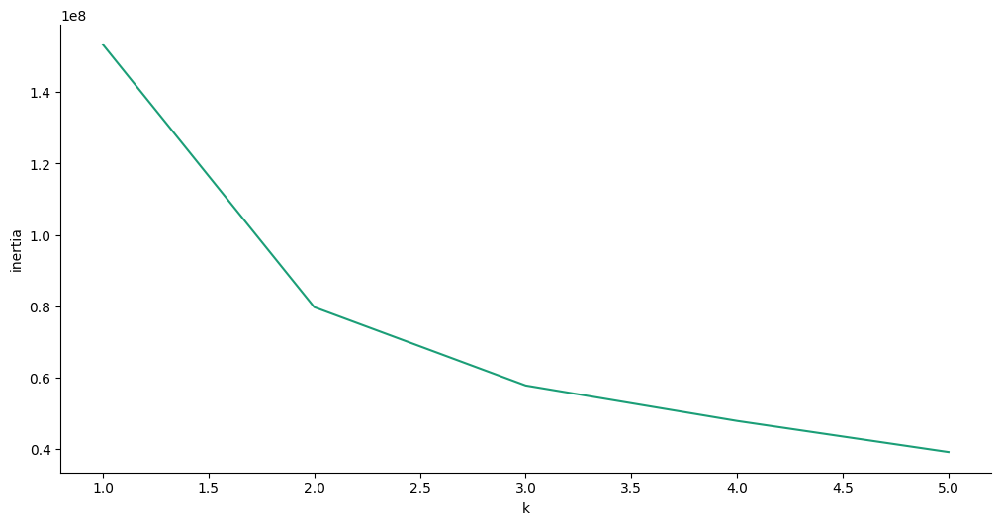

In [21]:
from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['k']
  ys = series['inertia']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_3.sort_values('k', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('k')
_ = plt.ylabel('inertia')

In [20]:
# Plot the DataFrame using the DataFrame variable, not the dictionary
df_elbow.hvplot.line(x='k', y='inertia', title='Elbow Curve', xticks=k)

:Curve   [k]   (inertia)

In [22]:
# Define the model with 3 clusters
model = KMeans(n_clusters=3, random_state=0)

# Fit the model
model.fit(pca_df)

# Predict clusters
k_3 = model.predict(pca_df)

# Create a copy of the PCA DataFrame
pca_df_predictions = pca_df.copy()

# Add the predicted class columns
pca_df_predictions['heart_segments'] = k_3

# Review the DataFrame
pca_df_predictions.head()

,PC1,PC2,PC3,heart_segments
0,-11.801625,-2.296231,-3.161396,0
1,11.366048,-6.377806,-0.239418,2
2,24.886468,-7.069572,-0.149111,1
3,7.479038,-2.436635,-3.656170,2
4,-2.747926,6.770316,8.820746,2


In [23]:
# Plot the clusters
pca_df_predictions.hvplot.scatter(
    x="PC1",
    y="PC2",
    by="heart_segments",
    title="Clusters of Heart Disease"
)

:NdOverlay   [heart_segments]
   :Scatter   [PC1]   (PC2)

In [24]:
model.score(pca_df)

-57809793.402178824

## Clean the code then go again

In [25]:
df1.head()

,State,Sex,GenHealth,PhysicalHealth,MentalHealth,LastCheckupTime,PhysicalActivity,SleepHours,RemovedTeeth,HeartAttack,...,HeightInMeters,WeightInKilograms,BMI,Drinking,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
342,Alabama,Female,Very good,4.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,None of them,No,...,1.60,71.67,27.99,No,No,Yes,Yes,"Yes, received Tdap",No,No
343,Alabama,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,6.0,None of them,No,...,1.78,95.25,30.13,No,No,Yes,Yes,"Yes, received tetanus shot but not sure what type",No,No
345,Alabama,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,"6 or more, but not all",No,...,1.85,108.86,31.66,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes
346,Alabama,Female,Fair,5.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,None of them,No,...,1.70,90.72,31.32,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes
347,Alabama,Female,Good,3.0,15.0,Within past year (anytime less than 12 months ...,Yes,5.0,1 to 5,No,...,1.55,79.38,33.07,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No


In [27]:
# Remove unneccessary columns using drop()
columns_to_drop = [
    'LastCheckupTime', 'RemovedTeeth', 'HadCOPD',
    'HadArthritis', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
    'DifficultyConcentrating',
    'DifficultyDressingBathing', 'DifficultyErrands',
    'HeightInMeters', 'WeightInKilograms',
    'HIVTesting', 'FluVaxLast12', 'PneumoVaxEver', 'TetanusLast10Tdap',
    'HighRiskLastYear', 'CovidPos'
]
df2 = df1.drop(columns=columns_to_drop)
df2.head()

,State,Sex,GenHealth,PhysicalHealth,MentalHealth,PhysicalActivity,SleepHours,HeartAttack,Angina,Stroke,...,KidneyDisease,Diabetes,DiffWalking,Smoking,ECigaretteUsage,ChestScan,Race,Age,BMI,Drinking
342,Alabama,Female,Very good,4.0,0.0,Yes,9.0,No,No,No,...,No,No,No,Former smoker,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 65 to 69,27.99,No
343,Alabama,Male,Very good,0.0,0.0,Yes,6.0,No,No,No,...,No,Yes,No,Former smoker,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 70 to 74,30.13,No
345,Alabama,Male,Very good,0.0,0.0,No,8.0,No,No,No,...,No,No,Yes,Former smoker,Never used e-cigarettes in my entire life,Yes,"White only, Non-Hispanic",Age 75 to 79,31.66,Yes
346,Alabama,Female,Fair,5.0,0.0,Yes,9.0,No,No,No,...,No,No,Yes,Never smoked,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 80 or older,31.32,No
347,Alabama,Female,Good,3.0,15.0,Yes,5.0,No,No,No,...,No,No,No,Never smoked,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 80 or older,33.07,No


In [28]:
# Renaming columns using a dictionary
df2 = df2.rename(columns={
    'AgeCategory': "Age",
    'RaceEthnicityCategory': "Race",
    'GeneralHealth': "GenHealth",
    'PhysicalHealthDays': "PhysicalHealth",
    'PhysicalActivities': "PhysicalActivity",
    'MentalHealthDays': "MentalHealth",
    'HadAngina': "Angina",
    'HadHeartAttack': "HeartAttack",
    'HadStroke': "Stroke",
    'HadAsthma': "Asthma",
    'HadSkinCancer': "SkinCancer",
    'HadDepressiveDisorder': "Depressed",
    'HadKidneyDisease': "KidneyDisease",
    'DifficultyWalking': "DiffWalking",
    'HadDiabetes': "Diabetes",
    'SmokerStatus': "Smoking",
    'AlcoholDrinkers': "Drinking"
})
df2

,State,Sex,GenHealth,PhysicalHealth,MentalHealth,PhysicalActivity,SleepHours,HeartAttack,Angina,Stroke,...,KidneyDisease,Diabetes,DiffWalking,Smoking,ECigaretteUsage,ChestScan,Race,Age,BMI,Drinking
342,Alabama,Female,Very good,4.0,0.0,Yes,9.0,No,No,No,...,No,No,No,Former smoker,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 65 to 69,27.99,No
343,Alabama,Male,Very good,0.0,0.0,Yes,6.0,No,No,No,...,No,Yes,No,Former smoker,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 70 to 74,30.13,No
345,Alabama,Male,Very good,0.0,0.0,No,8.0,No,No,No,...,No,No,Yes,Former smoker,Never used e-cigarettes in my entire life,Yes,"White only, Non-Hispanic",Age 75 to 79,31.66,Yes
346,Alabama,Female,Fair,5.0,0.0,Yes,9.0,No,No,No,...,No,No,Yes,Never smoked,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 80 or older,31.32,No
347,Alabama,Female,Good,3.0,15.0,Yes,5.0,No,No,No,...,No,No,No,Never smoked,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 80 or older,33.07,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445117,Virgin Islands,Male,Very good,0.0,0.0,Yes,6.0,No,No,No,...,No,No,No,Never smoked,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 60 to 64,32.28,Yes
445123,Virgin Islands,Female,Fair,0.0,7.0,Yes,7.0,No,No,No,...,No,No,No,Never smoked,Never used e-cigarettes in my entire life,No,"Black only, Non-Hispanic",Age 25 to 29,24.34,No
445124,Virgin Islands,Male,Good,0.0,15.0,Yes,7.0,No,No,Yes,...,No,Yes,No,Never smoked,Never used e-cigarettes in my entire life,No,"Multiracial, Non-Hispanic",Age 65 to 69,29.86,Yes
445128,Virgin Islands,Female,Excellent,2.0,2.0,Yes,7.0,No,No,No,...,No,No,No,Never smoked,Never used e-cigarettes in my entire life,No,"Black only, Non-Hispanic",Age 50 to 54,28.66,No


Convert categorical variables to numerical variables

In [29]:
# Identify binary columns
# The condition checks if the column has exactly 2 unique values using the nunique()
binary_cols = [col for col in df2.columns if df1[col].nunique() == 2]
binary_cols

['Sex',
 'PhysicalActivity',
 'HeartAttack',
 'Angina',
 'Stroke',
 'Asthma',
 'SkinCancer',
 'Depressed',
 'KidneyDisease',
 'DiffWalking',
 'ChestScan',
 'Drinking']

In [30]:
# Copy df1 to df2
df3 = df2.copy()

# Then, drop column named "State"
df3 = df3.drop("State", axis=1)

In [31]:
df3.columns

Index(['Sex', 'GenHealth', 'PhysicalHealth', 'MentalHealth',
       'PhysicalActivity', 'SleepHours', 'HeartAttack', 'Angina', 'Stroke',
       'Asthma', 'SkinCancer', 'Depressed', 'KidneyDisease', 'Diabetes',
       'DiffWalking', 'Smoking', 'ECigaretteUsage', 'ChestScan', 'Race', 'Age',
       'BMI', 'Drinking'],
      dtype='object')

In [32]:
# Convert and verify binary columns
all_binary = True

for col in binary_cols:
    unique_values = df3[col].unique()
    if set(unique_values) != {0, 1}:
        mapping = {unique_values[0]: 0, unique_values[1]: 1}
        df3[col] = df3[col].map(mapping)

    # Verify conversion
    if set(df3[col].unique()) != {0, 1}:
        all_binary = False
        print(f"Column {col} has non-binary values: {set(df3[col].unique())}")

if all_binary:
    print("All binary columns have been successfully converted to 0 and 1.")
else:
    print("Some columns still have non-binary values.")

All binary columns have been successfully converted to 0 and 1.


In [33]:
heart_dummies = pd.get_dummies(df3, columns=["Age", "Race", "GenHealth", "DiffWalking", "Smoking", "Drinking"])
heart_dummies.head()

,Sex,PhysicalHealth,MentalHealth,PhysicalActivity,SleepHours,HeartAttack,Angina,Stroke,Asthma,SkinCancer,...,GenHealth_Poor,GenHealth_Very good,DiffWalking_0,DiffWalking_1,Smoking_Current smoker - now smokes every day,Smoking_Current smoker - now smokes some days,Smoking_Former smoker,Smoking_Never smoked,Drinking_0,Drinking_1
342,0,4.0,0.0,0,9.0,0,0,0,0,0,...,False,True,True,False,False,False,True,False,True,False
343,1,0.0,0.0,0,6.0,0,0,0,0,0,...,False,True,True,False,False,False,True,False,True,False
345,1,0.0,0.0,1,8.0,0,0,0,0,0,...,False,True,False,True,False,False,True,False,False,True
346,0,5.0,0.0,0,9.0,0,0,0,0,1,...,False,False,False,True,False,False,False,True,True,False
347,0,3.0,15.0,0,5.0,0,0,0,0,0,...,False,False,True,False,False,False,False,True,True,False


In [34]:
# Initialize the K-Means model with n_clusters = 3
model = KMeans(n_clusters=3)

# Random Forest Solution

## Loading Encoded Data

In [35]:
# Define features set
X = df3.copy()
X.drop("HeartAttack", axis=1, inplace=True)
X.head()

,Sex,GenHealth,PhysicalHealth,MentalHealth,PhysicalActivity,SleepHours,Angina,Stroke,Asthma,SkinCancer,...,KidneyDisease,Diabetes,DiffWalking,Smoking,ECigaretteUsage,ChestScan,Race,Age,BMI,Drinking
342,0,Very good,4.0,0.0,0,9.0,0,0,0,0,...,0,No,0,Former smoker,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 65 to 69,27.99,0
343,1,Very good,0.0,0.0,0,6.0,0,0,0,0,...,0,Yes,0,Former smoker,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 70 to 74,30.13,0
345,1,Very good,0.0,0.0,1,8.0,0,0,0,0,...,0,No,1,Former smoker,Never used e-cigarettes in my entire life,1,"White only, Non-Hispanic",Age 75 to 79,31.66,1
346,0,Fair,5.0,0.0,0,9.0,0,0,0,1,...,0,No,1,Never smoked,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 80 or older,31.32,0
347,0,Good,3.0,15.0,0,5.0,0,0,0,0,...,0,No,0,Never smoked,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 80 or older,33.07,0


In [36]:
y = df3["HeartAttack"].values.reshape(-1,1)
y[:5]

array([[0],
       [0],
       [0],
       [0],
       [0]])

In [37]:
# Splitting into Train and Test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

In [38]:
# Creating StandardScaler instance
scaler = StandardScaler()

In [41]:
# Encoding categorical features
X_train_encoded = pd.get_dummies(X_train, columns=["GenHealth"])

# Identify non-numerical columns
non_numeric_cols = X_train_encoded.select_dtypes(exclude=['number']).columns

# Convert non-numerical columns to numerical (example using LabelEncoder)
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for col in non_numeric_cols:
    X_train_encoded[col] = label_encoder.fit_transform(X_train_encoded[col])

# Fitting Standard Scaler after encoding
X_scaler = scaler.fit(X_train_encoded)

In [43]:
# Scaling data
X_train_scaled = X_scaler.transform(X_train_encoded) # Use the encoded training data

# Encoding and scaling the test data
X_test_encoded = pd.get_dummies(X_test, columns=["GenHealth"]) # One-hot encode the test data
non_numeric_cols_test = X_test_encoded.select_dtypes(exclude=['number']).columns
for col in non_numeric_cols_test:
    X_test_encoded[col] = label_encoder.fit_transform(X_test_encoded[col]) # Use the same label encoder as for training data
X_test_scaled = X_scaler.transform(X_test_encoded) # Transform the encoded test data

## Fitting the Random Forest Model

In [44]:
# Create a random forest classifier
rf_model = RandomForestClassifier(n_estimators=500, random_state=78)

In [45]:
# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

## Making Predictions Using the Random Forest Model

In [46]:
# Making predictions using the testing data
predictions = rf_model.predict(X_test_scaled)

## Model Evaluation

In [47]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions)
cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)

# Calculating the accuracy score
acc_score = accuracy_score(y_test, predictions)

In [48]:
# Displaying results
print("Confusion Matrix")
display(cm_df)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))

Confusion Matrix


,Predicted 0,Predicted 1
Actual 0,57571,603
Actual 1,2591,739


Accuracy Score : 0.948068418314256
Classification Report
              precision    recall  f1-score   support

           0       0.96      0.99      0.97     58174
           1       0.55      0.22      0.32      3330

    accuracy                           0.95     61504
   macro avg       0.75      0.61      0.64     61504
weighted avg       0.93      0.95      0.94     61504



## Feature Importance

In [49]:
# Random Forests in sklearn will automatically calculate feature importance
importances = rf_model.feature_importances_
# We can sort the features by their importance
sorted(zip(rf_model.feature_importances_, X.columns), reverse=True)

[(0.2125489235453762, 'Age'),
 (0.16449963756721445, 'SleepHours'),
 (0.08313145278594865, 'PhysicalActivity'),
 (0.08073501236834205, 'Race'),
 (0.06529753055057638, 'GenHealth'),
 (0.05127489552336105, 'PhysicalHealth'),
 (0.03650257977346791, 'DiffWalking'),
 (0.030387476796982504, 'ChestScan'),
 (0.02536445171585434, 'Smoking'),
 (0.023121597268393808, 'BMI'),
 (0.022508494441585473, 'KidneyDisease'),
 (0.021694593243416337, 'MentalHealth'),
 (0.019041990389122607, 'Angina'),
 (0.018889454306125805, 'Stroke'),
 (0.018401664857270184, 'ECigaretteUsage'),
 (0.018230891286608056, 'SkinCancer'),
 (0.017601009937309384, 'Sex'),
 (0.01720377024632948, 'Diabetes'),
 (0.01678775491548321, 'Asthma'),
 (0.013578279270238967, 'Depressed'),
 (0.004562085151101266, 'Drinking')]

<Axes: title={'center': 'Features Importances'}, ylabel='1'>

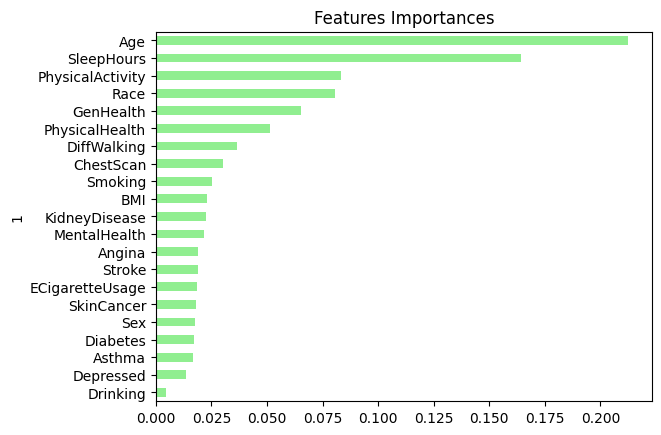

In [50]:
# Visualize the features by importance
importances_df = pd.DataFrame(sorted(zip(rf_model.feature_importances_, X.columns), reverse=True))
importances_df.set_index(importances_df[1], inplace=True)
importances_df.drop(columns=1, inplace=True)
importances_df.rename(columns={0: 'Feature Importances'}, inplace=True)
importances_sorted = importances_df.sort_values(by='Feature Importances')
importances_sorted.plot(kind='barh', color='lightgreen', title= 'Features Importances', legend=False)

# Decision Trees Solution

In [51]:
# Define features set
X = df3.copy()
X.drop("HeartAttack", axis=1, inplace=True)
X.head()

,Sex,GenHealth,PhysicalHealth,MentalHealth,PhysicalActivity,SleepHours,Angina,Stroke,Asthma,SkinCancer,...,KidneyDisease,Diabetes,DiffWalking,Smoking,ECigaretteUsage,ChestScan,Race,Age,BMI,Drinking
342,0,Very good,4.0,0.0,0,9.0,0,0,0,0,...,0,No,0,Former smoker,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 65 to 69,27.99,0
343,1,Very good,0.0,0.0,0,6.0,0,0,0,0,...,0,Yes,0,Former smoker,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 70 to 74,30.13,0
345,1,Very good,0.0,0.0,1,8.0,0,0,0,0,...,0,No,1,Former smoker,Never used e-cigarettes in my entire life,1,"White only, Non-Hispanic",Age 75 to 79,31.66,1
346,0,Fair,5.0,0.0,0,9.0,0,0,0,1,...,0,No,1,Never smoked,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 80 or older,31.32,0
347,0,Good,3.0,15.0,0,5.0,0,0,0,0,...,0,No,0,Never smoked,Never used e-cigarettes in my entire life,0,"White only, Non-Hispanic",Age 80 or older,33.07,0


In [52]:
y = df3["HeartAttack"].values.reshape(-1,1)
y[:5]

array([[0],
       [0],
       [0],
       [0],
       [0]])

In [53]:
# Splitting into Train and Test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

In [54]:
# Creating StandardScaler instance
scaler = StandardScaler()


In [56]:
# Encoding categorical features
X_train_encoded = pd.get_dummies(X_train, columns=["GenHealth"])

# Identify non-numerical columns
non_numeric_cols = X_train_encoded.select_dtypes(exclude=['number']).columns

# Convert non-numerical columns to numerical (example using LabelEncoder)
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for col in non_numeric_cols:
    X_train_encoded[col] = label_encoder.fit_transform(X_train_encoded[col])

# Fitting Standard Scaler after encoding
X_scaler = scaler.fit(X_train_encoded)

In [58]:
# Scaling data
X_train_scaled = X_scaler.transform(X_train_encoded) # Use the encoded training data

# Encoding and scaling the test data
X_test_encoded = pd.get_dummies(X_test, columns=["GenHealth"]) # One-hot encode the test data
non_numeric_cols_test = X_test_encoded.select_dtypes(exclude=['number']).columns
for col in non_numeric_cols_test:
    X_test_encoded[col] = label_encoder.fit_transform(X_test_encoded[col]) # Use the same label encoder as for training data
X_test_scaled = X_scaler.transform(X_test_encoded) # Transform the encoded test data

## Fitting the Decision Tree Model

In [60]:
# Import dependencies
from sklearn import tree

# Creating the decision tree classifier instance
model = tree.DecisionTreeClassifier()

In [61]:
# Fitting the model
model = model.fit(X_train_scaled, y_train)

## Making Predictions Using the Tree Model

In [62]:
# Making predictions using the testing data
predictions = model.predict(X_test_scaled)

## Model Evaluation

In [63]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions)
cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)

# Calculating the accuracy score
acc_score = accuracy_score(y_test, predictions)

In [64]:
# Displaying results
print("Confusion Matrix")
display(cm_df)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))

Confusion Matrix


,Predicted 0,Predicted 1
Actual 0,55269,2905
Actual 1,2293,1037


Accuracy Score : 0.9154851716961498
Classification Report
              precision    recall  f1-score   support

           0       0.96      0.95      0.96     58174
           1       0.26      0.31      0.29      3330

    accuracy                           0.92     61504
   macro avg       0.61      0.63      0.62     61504
weighted avg       0.92      0.92      0.92     61504

